# Xử lý ảnh
## Diep Ng., Ph.D. 

Mail-to: ngocdiep at vnu.edu.vn

# Week2 : Fundamentals in Image processing

1. Read, display and save image with opencv2
2. Examples of point operations

In [1]:
!python --version

Python 3.11.7


In [2]:
%pwd

'/Users/UET/Computer_vision'

In [7]:
!pip install opencv-python==4.8.0.74 matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.1/33.1 MB 11.0 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.10.0.84
    Uninstalling opencv-python-4.10.0.84:
      Successfully uninstalled opencv-python-4.10.0.84

[notice] A new release of pip is available: 25.0 -> 25.0.1
[notice] To update, run: pip install --upgrade pip


## 1. Basic functions with OpenCV

### Import libraries

In [1]:
#import libraries
import cv2
import numpy as np

#to display at jupyter notebook
import matplotlib.pyplot as plt
%matplotlib inline

In [9]:
plt.rcParams['figure.figsize'] = [10, 8]

### Read and display image

In [10]:
iname = "penguin.png"

In [11]:
#read image
image = cv2.imread(iname)

In [12]:
# each image is a matrix of size HxWx3
image

array([[[ 65,  67,  79],
        [ 65,  68,  79],
        [ 59,  64,  76],
        ...,
        [198, 203, 210],
        [198, 202, 209],
        [198, 202, 208]],

       [[ 75,  77,  87],
        [ 72,  75,  86],
        [ 67,  69,  81],
        ...,
        [204, 207, 215],
        [204, 208, 215],
        [204, 208, 214]],

       [[ 79,  80,  92],
        [ 74,  77,  88],
        [ 77,  79,  91],
        ...,
        [209, 212, 219],
        [209, 213, 220],
        [210, 215, 221]],

       ...,

       [[ 29,  46,  43],
        [ 25,  42,  40],
        [ 29,  46,  45],
        ...,
        [ 76, 100, 100],
        [ 66,  91,  89],
        [ 60,  86,  84]],

       [[ 38,  54,  50],
        [ 38,  55,  53],
        [ 51,  68,  68],
        ...,
        [ 70,  96,  94],
        [ 66,  92,  90],
        [ 66,  93,  91]],

       [[ 61,  77,  74],
        [ 58,  76,  74],
        [ 58,  76,  75],
        ...,
        [ 67,  93,  90],
        [ 66,  92,  90],
        [ 66,  93,  91]]

In [13]:
#size of image
image.shape

(1446, 1086, 3)

In [14]:
type(image)

numpy.ndarray

In [15]:
h, w, num_channels = image.shape   ##NOTE: height & width position

In [16]:
print("height: %d, width: %d, num_channels: %d" % (h,w,num_channels))

height: 1446, width: 1086, num_channels: 3


In [17]:
image.size

4711068

In [18]:
image.dtype

dtype('uint8')

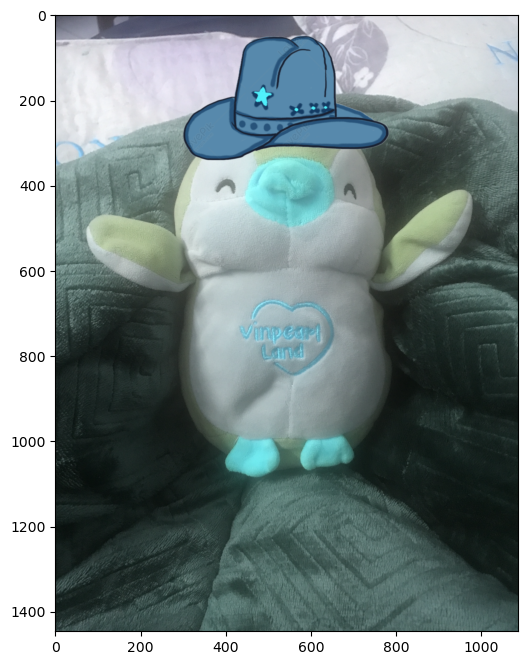

In [30]:
#Note cv2 read BGR as default
plt.imshow(image)
plt.show()

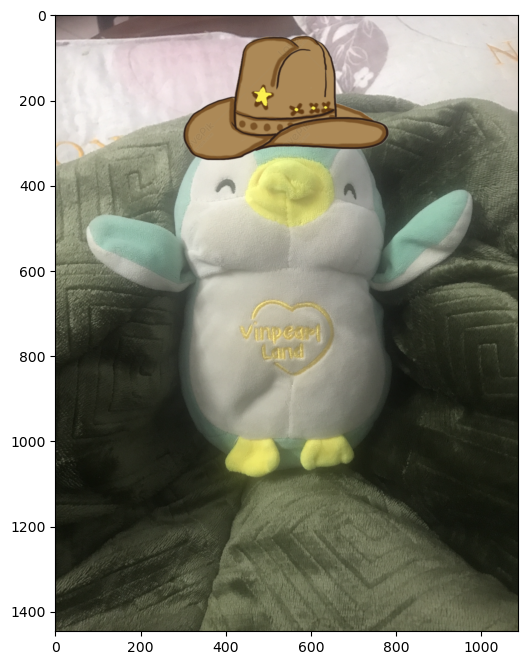

In [23]:
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

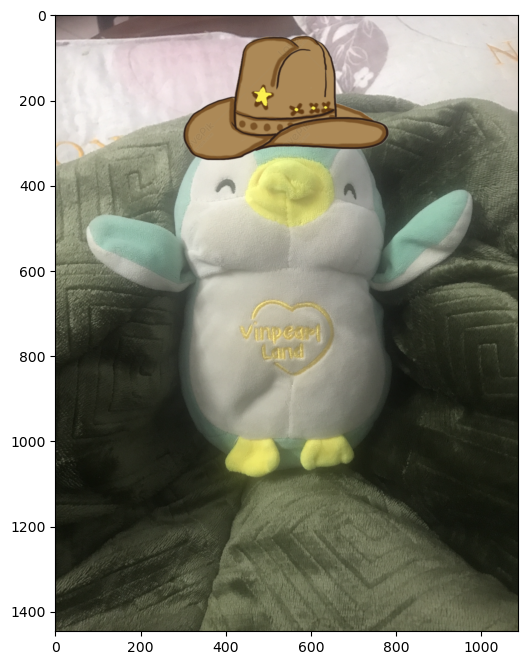

In [34]:
#display rgb image
plt.imshow(image[:,:,::-1])
# plt.show()

### `imread()` with different color format
- IMREAD_ANYCOLOR=4
- IMREAD_ANYDEPTH = 2
- IMREAD_COLOR=1
- IMREAD_GRAYSCALE = 0
- IMREAD_LOAD_GDAL = 8
- IMREAD_UNCHANGED = -1

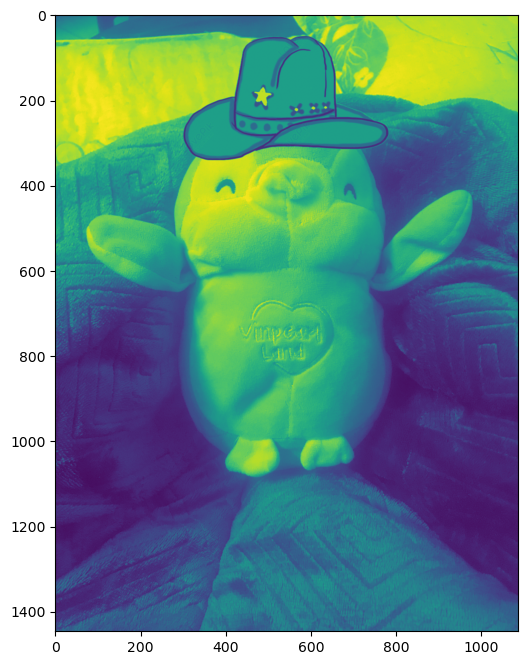

In [43]:
img = cv2.imread(iname, 0)
plt.imshow(img)

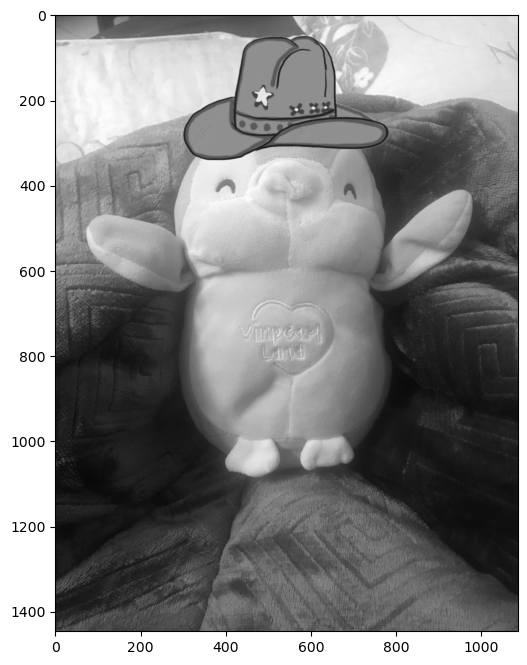

In [56]:
img = cv2.imread(iname, 0)
plt.imshow(img, cmap="gray")
plt.show()

In [44]:
img.shape

(1446, 1086)

In [31]:
img

array([[ 70,  70,  67, ..., 204, 203, 203],
       [ 79,  77,  72, ..., 209, 209, 209],
       [ 83,  79,  82, ..., 213, 214, 216],
       ...,
       [ 43,  39,  43, ...,  97,  87,  82],
       [ 50,  52,  66, ...,  92,  88,  89],
       [ 74,  73,  73, ...,  89,  88,  89]], dtype=uint8)

### Make a random image

In [45]:
import os
import numpy as np

In [52]:
#make an array of 120,000 random bytes
#since an image has 8bits per channel
#a byte is an integer ranging from 0 to 255
randomBytearray = bytearray(os.urandom(120000))
flatNumpyArray = np.array(randomBytearray)

In [48]:
type(flatNumpyArray)

numpy.ndarray

In [47]:
flatNumpyArray.shape

(120000,)

In [53]:
flatNumpyArray[10:20]

array([150, 200, 230,   0,   9, 186, 123, 189, 134,  54], dtype=uint8)

In [54]:
np.max(flatNumpyArray)

255

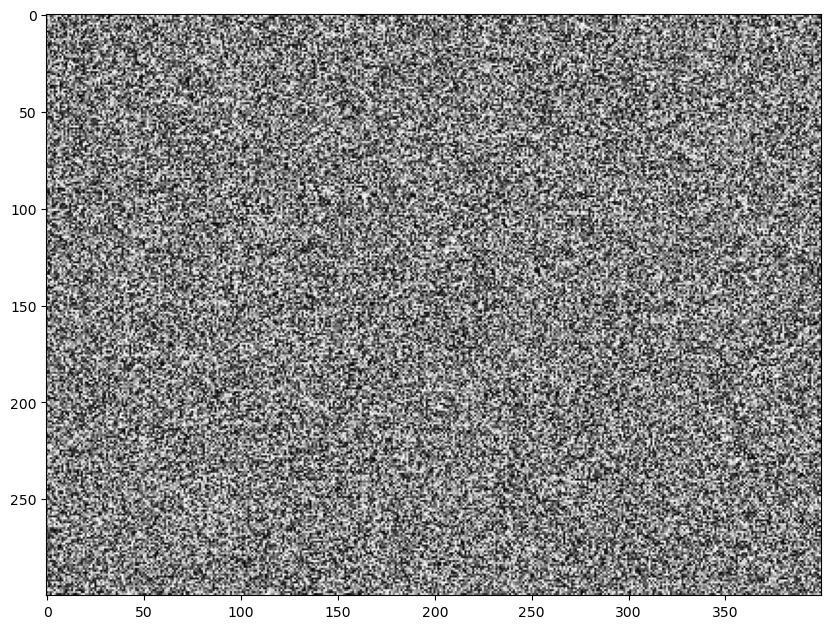

In [32]:
#convert the array to make a 400x300 grayscale image
grayImage = flatNumpyArray.reshape(300, 400)
plt.imshow(grayImage, cmap='gray')
plt.show()

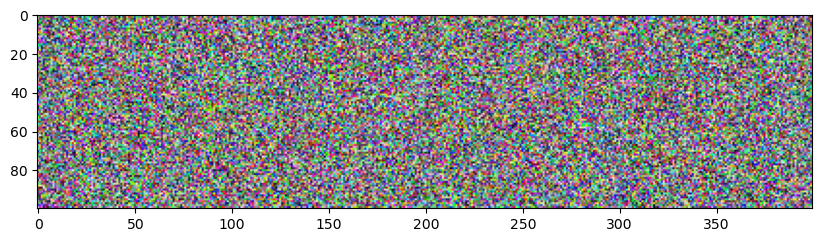

In [33]:
#conver the array to make a 400x100 color image
bgrImage = flatNumpyArray.reshape(100, 400, 3)
plt.imshow(bgrImage[:,:,::-1])
plt.show()

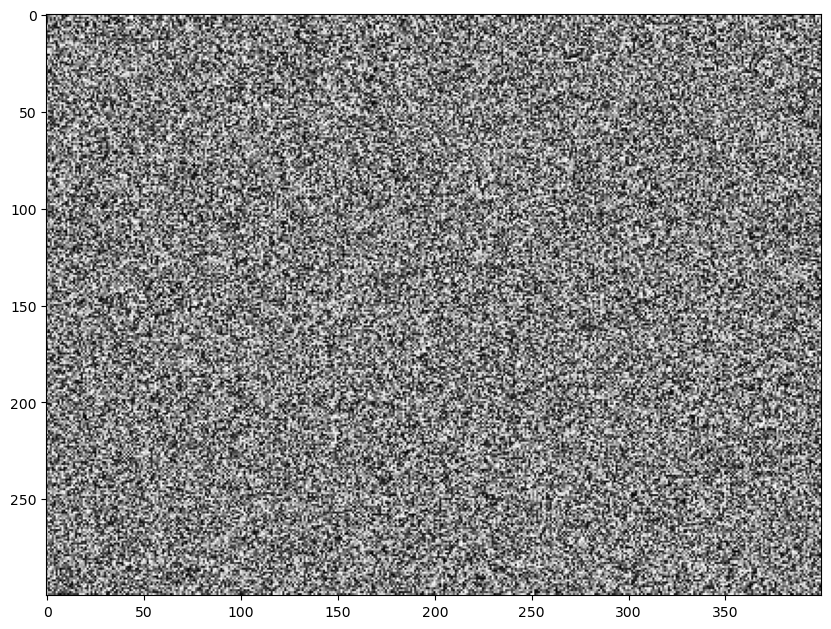

In [34]:
#another way
array = np.random.randint(0, 256, 120000)
grayImage = array.reshape(300, 400)
plt.imshow(grayImage, cmap='gray')
plt.show()

### Accessing image data with numpy.array 

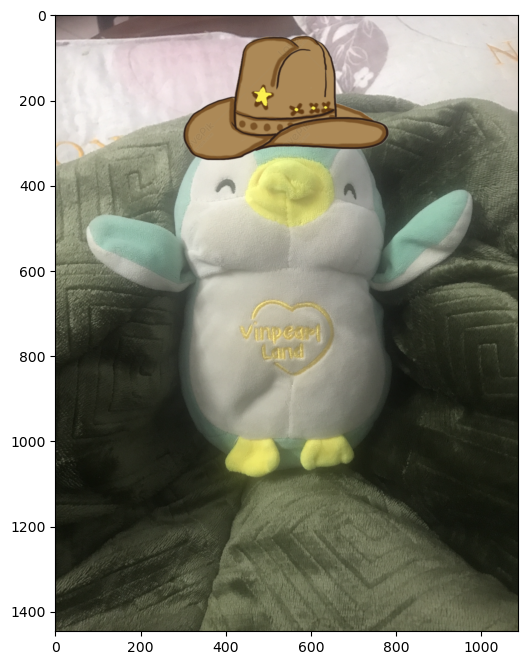

In [74]:
image = cv2.imread(iname)
plt.imshow(image[:,:,::-1])
plt.show()

In [62]:
image[0,0]

array([65, 67, 79], dtype=uint8)

In [63]:
image[0:10, 10:20,]

array([[[ 71,  75,  87],
        [ 68,  72,  84],
        [ 69,  73,  85],
        [ 72,  75,  88],
        [ 66,  69,  83],
        [ 65,  68,  82],
        [ 74,  78,  91],
        [ 73,  75,  89],
        [ 76,  77,  91],
        [ 80,  82,  96]],

       [[ 77,  81,  94],
        [ 76,  80,  92],
        [ 74,  78,  90],
        [ 77,  81,  94],
        [ 83,  86,  99],
        [ 75,  79,  92],
        [ 77,  80,  94],
        [ 78,  80,  94],
        [ 81,  82,  96],
        [ 84,  86, 100]],

       [[ 84,  88, 101],
        [ 85,  89, 101],
        [ 82,  85,  97],
        [ 84,  86,  99],
        [ 87,  89, 103],
        [ 84,  86, 100],
        [ 87,  90, 102],
        [ 87,  89, 102],
        [ 84,  86, 100],
        [ 85,  87, 101]],

       [[ 86,  89, 103],
        [ 85,  88, 101],
        [ 88,  89, 102],
        [ 88,  89, 103],
        [ 86,  87, 101],
        [ 89,  90, 104],
        [ 89,  91, 104],
        [ 86,  88, 100],
        [ 85,  86,  99],
        [ 92,  94, 

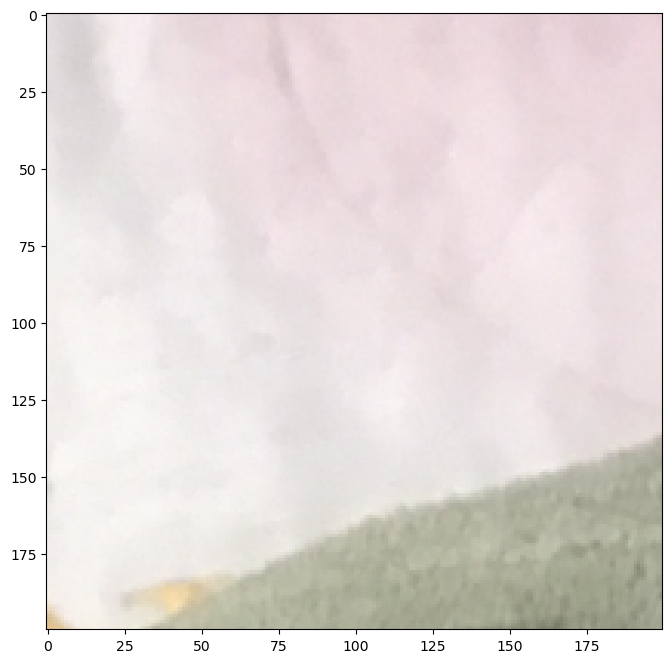

In [64]:
#crop image
crop = image[100:300, 100:300]
plt.imshow(crop[:,:,::-1])
plt.show()

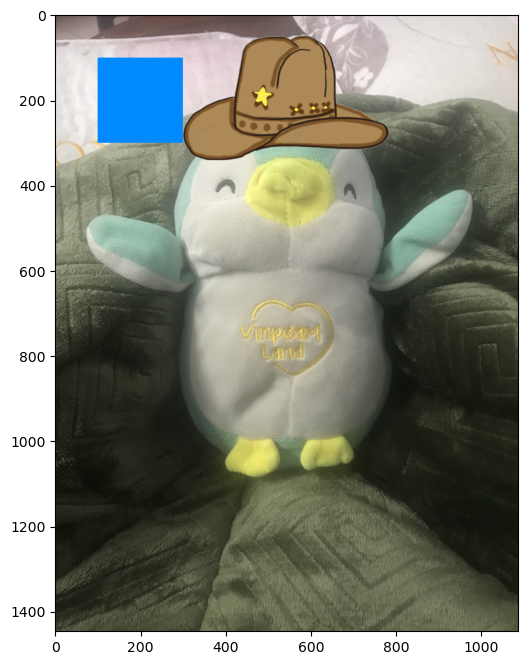

In [73]:
copy = image.copy()
copy[100:300, 100:300] = [255, 138, 1] #assign blue color
plt.imshow(copy[:,:,::-1])
plt.show()

### Resizing images

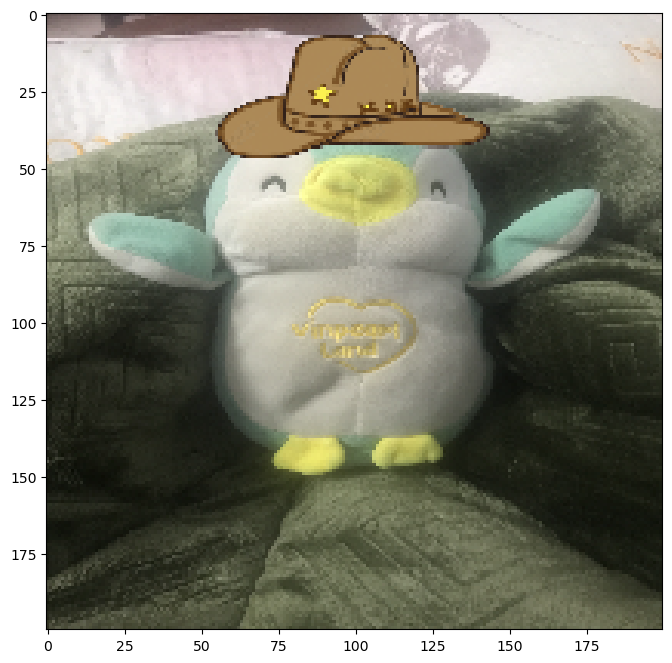

In [70]:
h, w = image.shape[:2]
resized = cv2.resize(image, (200, 200))
plt.imshow(resized[:,:,::-1])
plt.show()

In [71]:
#resize while keeping aspect ratio
new_w = 200
aspect_ratio = h/w
new_h = int(new_w*aspect_ratio)
print(new_h)

266


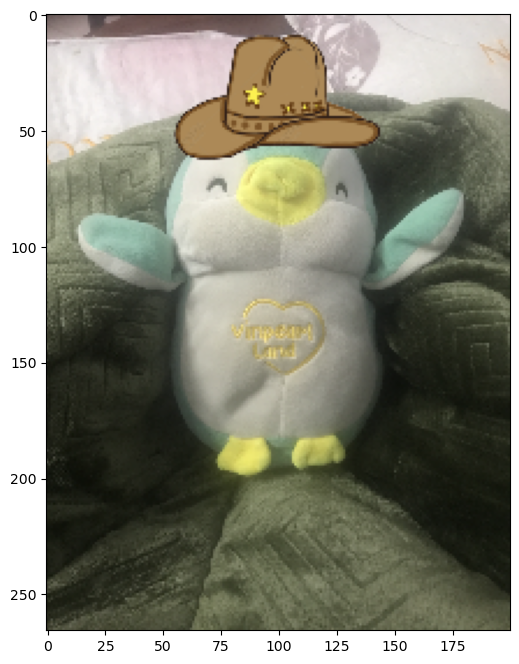

In [75]:
resized = cv2.resize(image, (new_w, new_h))
plt.imshow(resized[:,:,::-1])
plt.show()

### Write images

In [76]:
cv2.imwrite("resized_penguin.jpg", resized)

True

## 2. Point operations

In [47]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
%matplotlib inline

In [48]:
plt.rcParams['figure.figsize'] = [12, 8]

### 2.1. Image negation


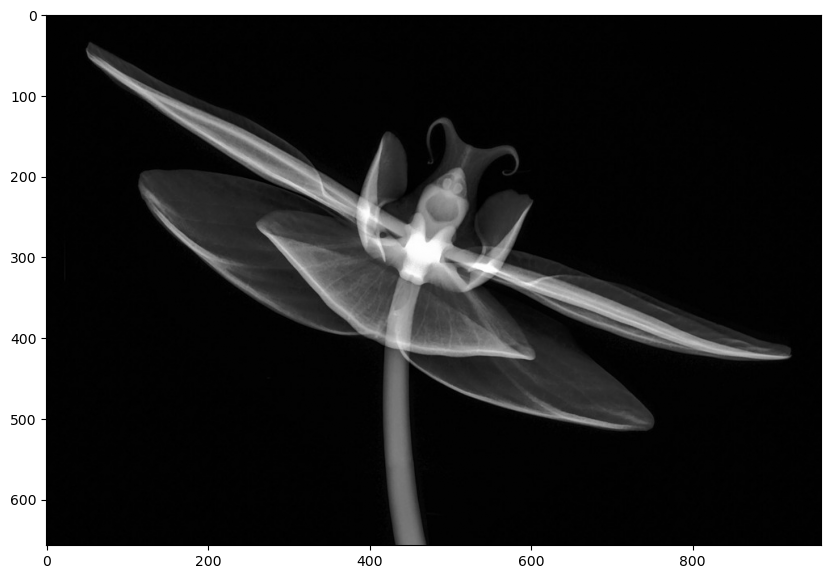

In [79]:
xray = cv2.imread("xray.jpeg", 0)
plt.imshow(xray, cmap='gray')
plt.show()

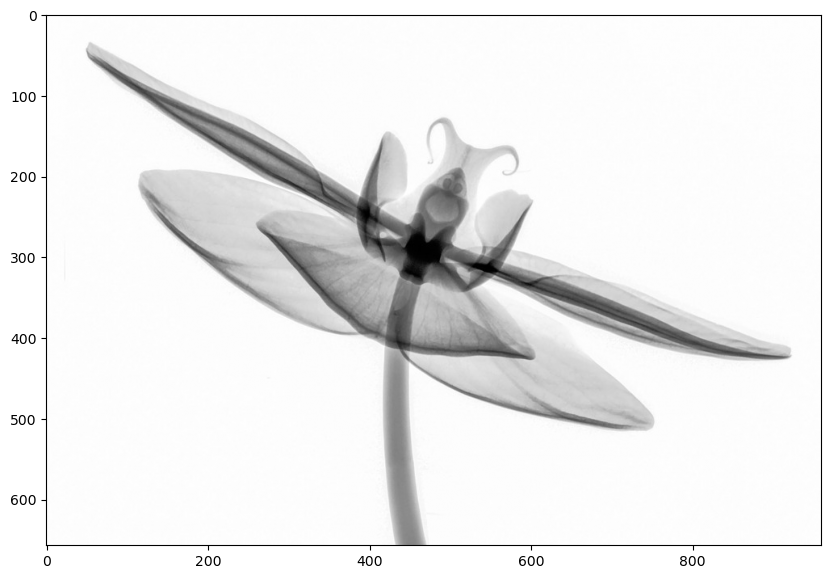

In [80]:
negation = 255 - xray
plt.imshow(negation, cmap='gray')
plt.show()

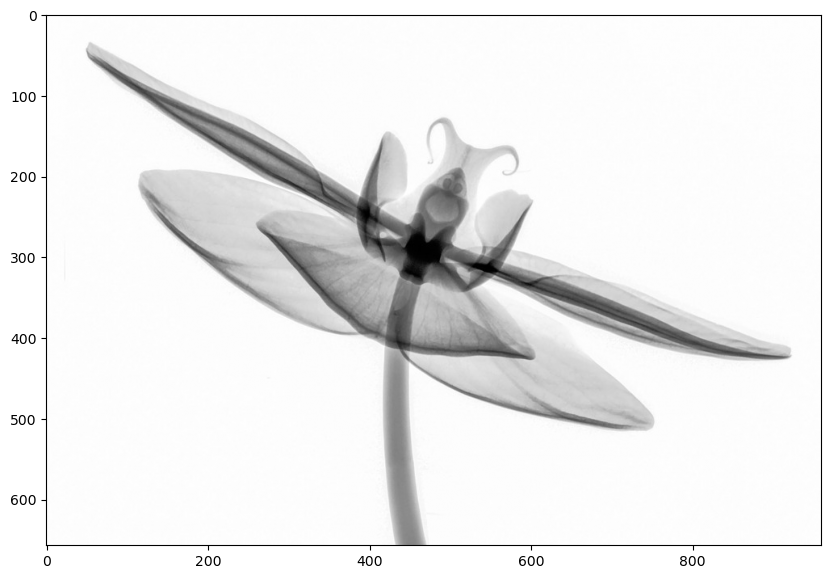

In [82]:
# another way to do negation?
negation = cv2.bitwise_not(xray)
plt.imshow(negation, cmap='gray')
plt.show()

### 2.2. Gamma correction

In [102]:
# plot a quantization image of k level
def draw_quantization_img(levels, height=32, cmap='gray'):
    #convert it to an image
    img = [levels] *  height
    img = np.array(img)
    plt.imshow(img, cmap=cmap)
#     plt.axis('off')

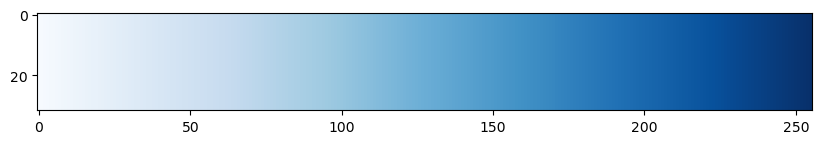

In [104]:
blue_256 = list(range(0, 256, 1))
draw_quantization_img(blue_256, cmap='Blues')
plt.show()

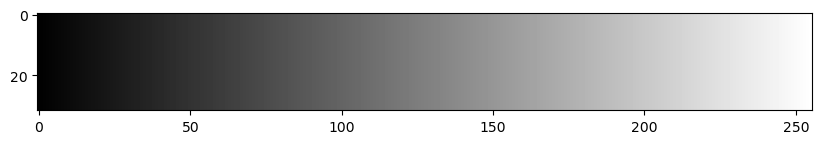

In [103]:
gray_256 = list(range(0, 256, 1))
draw_quantization_img(gray_256)
plt.show()

64


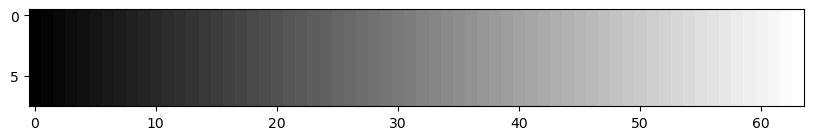

In [109]:
gray_64 = list(range(0, 256, 4))
print(len(gray_64))
draw_quantization_img(gray_64, height=8)
plt.show()

32


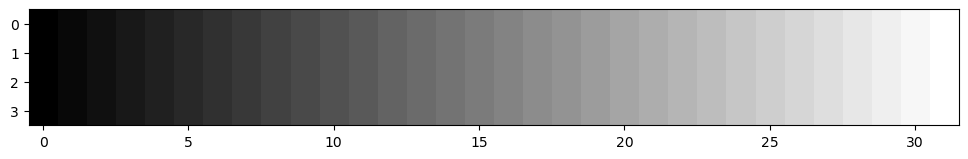

In [55]:
gray_32 = list(range(0, 256, 8))
print(len(gray_32))
draw_quantization_img(gray_32, height=4)
plt.show()

16


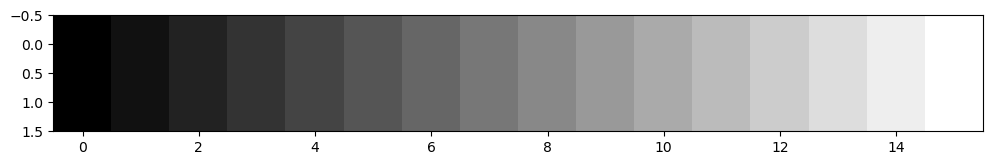

In [56]:
gray_16 = list(range(0, 256, 16))
print(len(gray_16))
draw_quantization_img(gray_16, height=2)
plt.show()

8


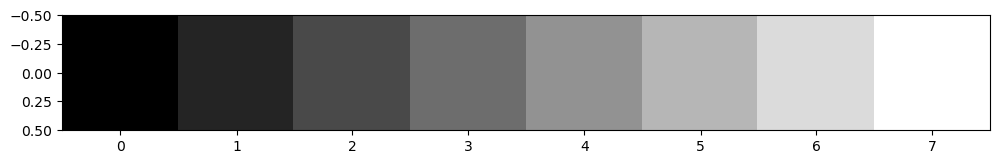

In [57]:
gray_8 = list(range(0, 256, 32))
print(len(gray_8))
draw_quantization_img(gray_8, height=1)
plt.show()

### Gamma

### $ v_{out} = v_{in}^\gamma$

$v_{in}$ : độ sáng thực tế (actual luminance value)

$v_{out}$: độ sáng cảm nhận (output luminance value)



In [58]:
def adjust_gamma(inlevels, gamma=1.0, debug=True):
    out = [l**gamma for l in inlevels]
    max_out = max(out)
    out = [int(l/max_out*256) for l in out]
    if debug:
        print(out)
    return out

[0, 17, 34, 51, 68, 85, 102, 119, 136, 153, 170, 187, 204, 221, 238, 256]


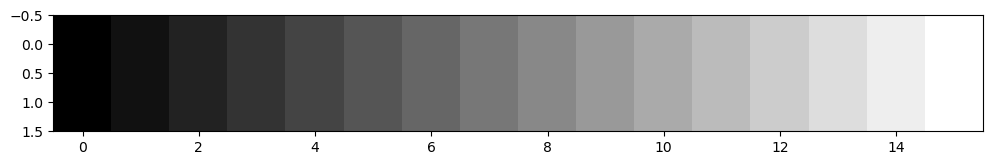

In [59]:
#no adjustment
draw_quantization_img(
        adjust_gamma(gray_16, gamma=1),
        height=2
)
plt.show()

[0, 0, 3, 7, 13, 22, 34, 47, 64, 83, 104, 129, 156, 186, 219, 256]


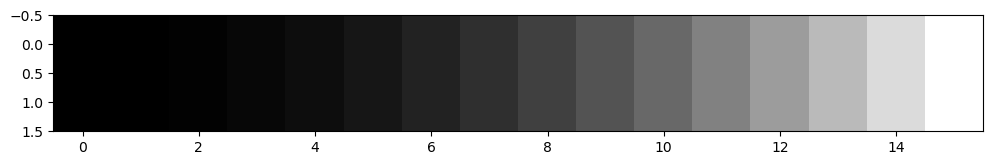

In [60]:
#with gamma >1, the levels are shifted toward the the darker end of the spectrum
draw_quantization_img(
        adjust_gamma(gray_16, gamma=2.2),
        height=2
)
plt.show()

[0, 74, 102, 123, 140, 155, 168, 181, 192, 202, 212, 222, 231, 239, 248, 256]


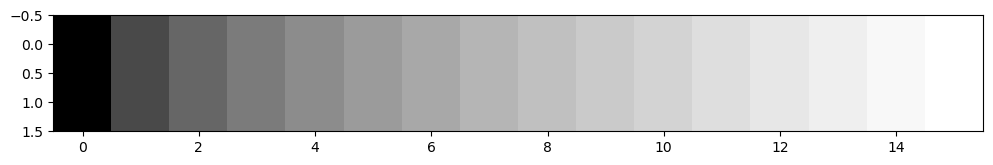

In [61]:
#with gamma < 1, lighter
draw_quantization_img(
        adjust_gamma(gray_16, gamma=1/2.2, debug=True),
        height=2
)
plt.show()

### Logarithmic graph



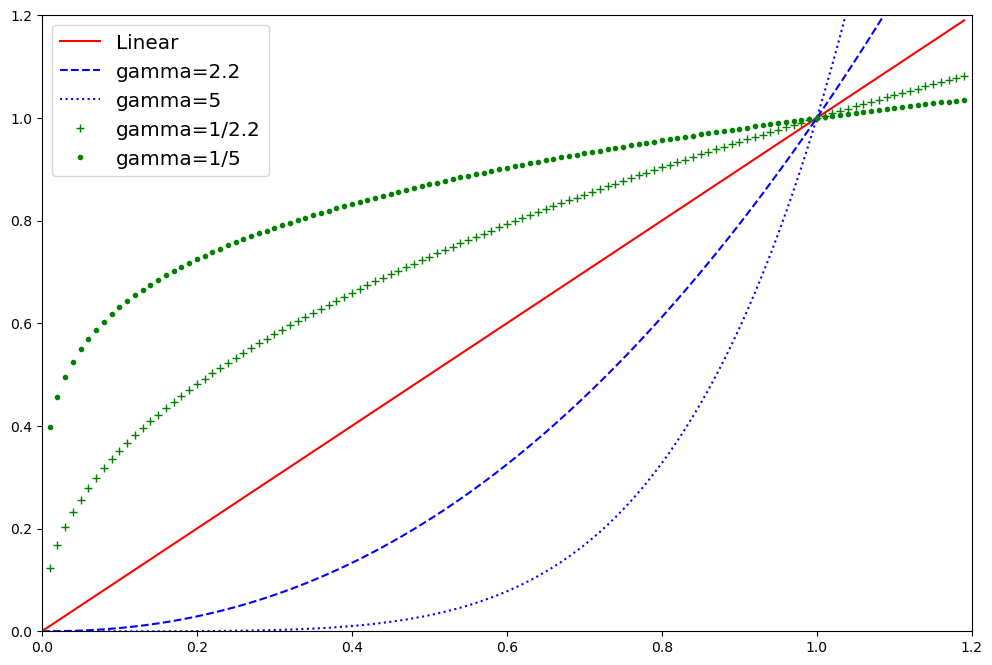

In [62]:
x = np.arange(0, 1.2, 0.01)

g1 = np.power(x, 1)
g2 = np.power(x, 2.2 ) #gamma=2.2
g3 = np.power(x, 5) #gamma=5


g4 = np.power(x, 1/2.2) 
g5 = np.power(x, 1/5)
fig, ax = plt.subplots()
ax.plot(x, g1, 'r', label='Linear')
ax.plot(x, g2, 'b--', label='gamma=2.2')
ax.plot(x, g3, 'b:', label='gamma=5')
ax.plot(x, g4, 'g+', label='gamma=1/2.2')
ax.plot(x, g5, 'g.', label='gamma=1/5')

ax.set_xlim([0, 1.2])
ax.set_ylim([0, 1.2])
# plt.yscale('log')
legend = ax.legend(loc='upper left', fontsize='x-large')

plt.rcParams['figure.figsize'] = [8, 8]
plt.show()



### Using gamma to adjust contrast

### 1. Low exposure

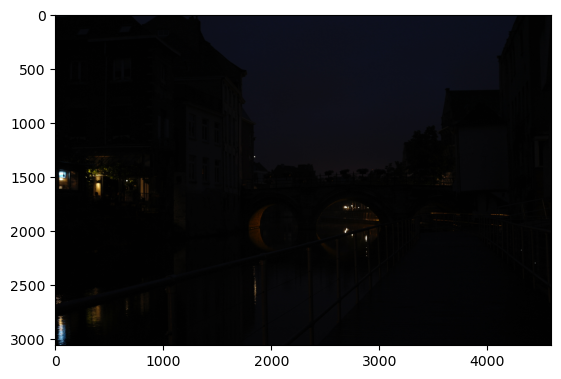

In [2]:
low = cv2.imread("low-exposure.jpg")
plt.imshow(low[:,:,::-1])
plt.show()

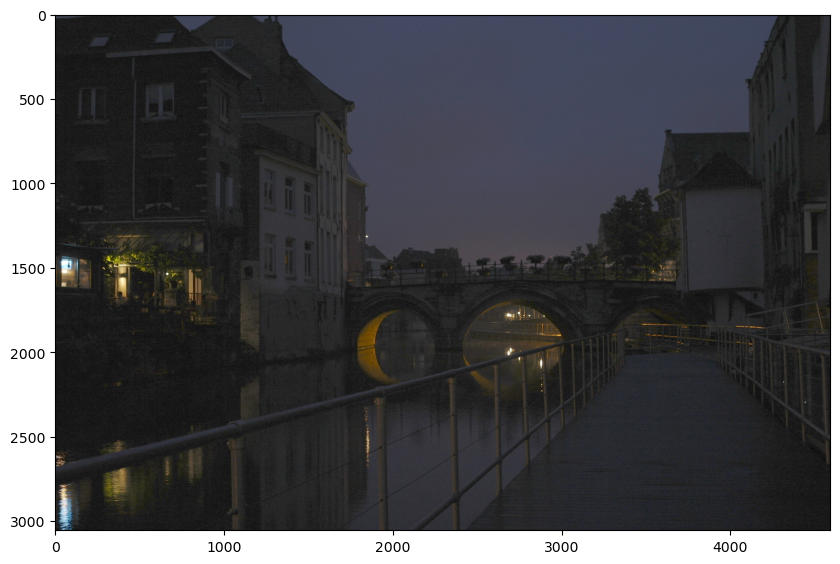

In [27]:
def adjust_image_gamma(image, gamma=1.0):
    image = np.power(image, gamma)
    max_val = np.max(image.ravel())
    image = image/max_val*255
    image = image.astype(np.uint8)
    return image

low_adjusted = adjust_image_gamma(low, 0.45)
plt.imshow(low_adjusted[:,:,::-1])
plt.show()

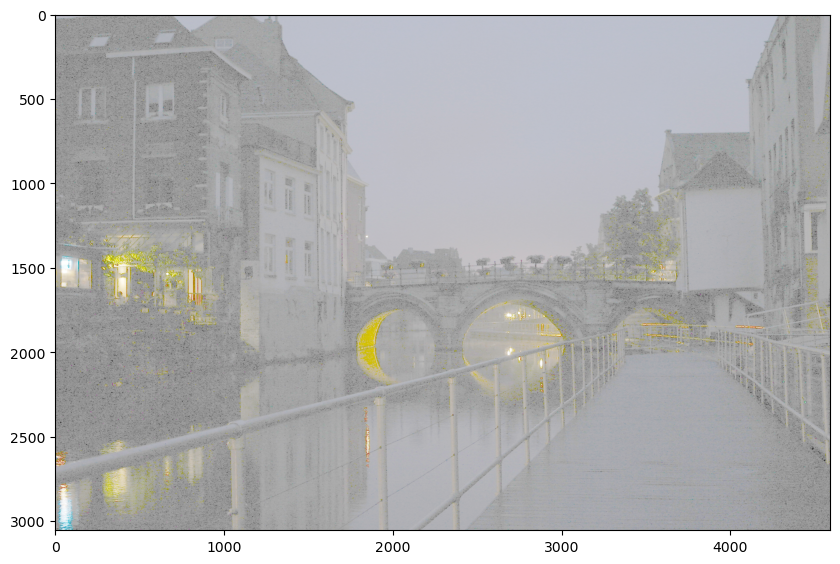

In [28]:
# what if gamma is too low?
low_adjusted = adjust_image_gamma(low, 0.1)
plt.imshow(low_adjusted[:,:,::-1])
plt.show()

In [29]:
%timeit low_adjusted = adjust_image_gamma(low, 0.1)

702 ms ± 55.4 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [30]:
#faster way to compute
#reference: https://www.pyimagesearch.com/2015/10/05/opencv-gamma-correction/
def adjust_image_gamma_lookuptable(image, gamma=1.0):
    # build a lookup table mapping the pixel values [0, 255] to
    # their adjusted gamma values
    table = np.array([((i / 255.0) ** gamma) * 255
        for i in np.arange(0, 256)]).astype("uint8")

    # apply gamma correction using the lookup table
    return cv2.LUT(image, table)

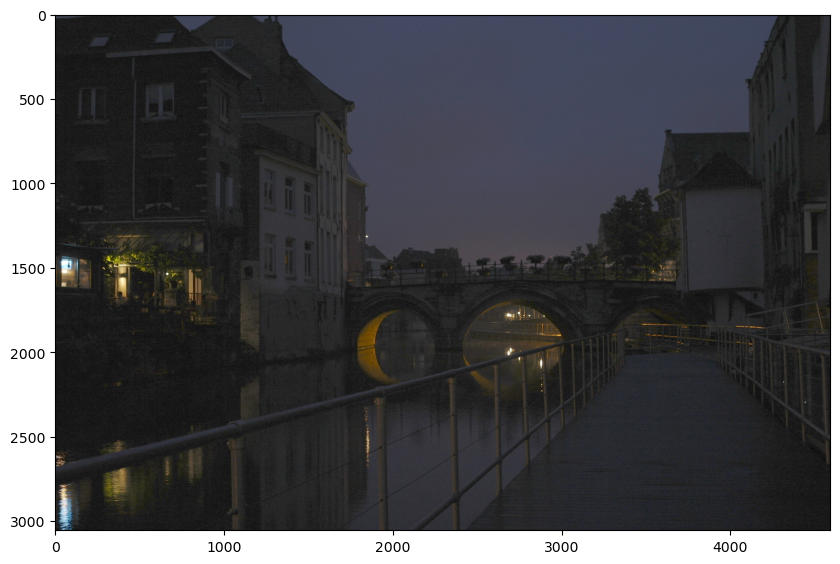

In [31]:
low_adjusted = adjust_image_gamma_lookuptable(low, 0.45)
plt.imshow(low_adjusted[:,:,::-1])
plt.show()

In [32]:
%timeit adjust_image_gamma_lookuptable(low, 0.45)

8.57 ms ± 210 μs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [33]:
### yeahhh

### Overexposure

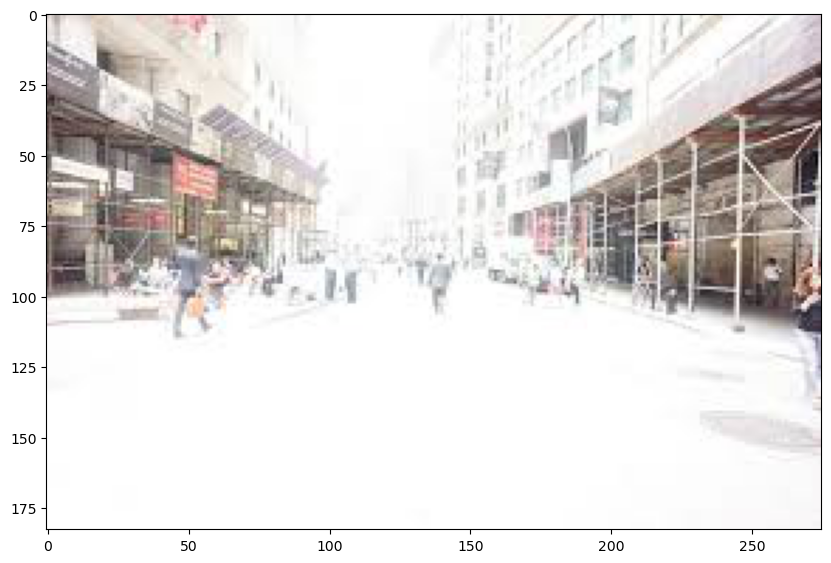

In [34]:
high = cv2.imread("high-exposure.jpg")
plt.imshow(high[:,:,::-1])
plt.show()

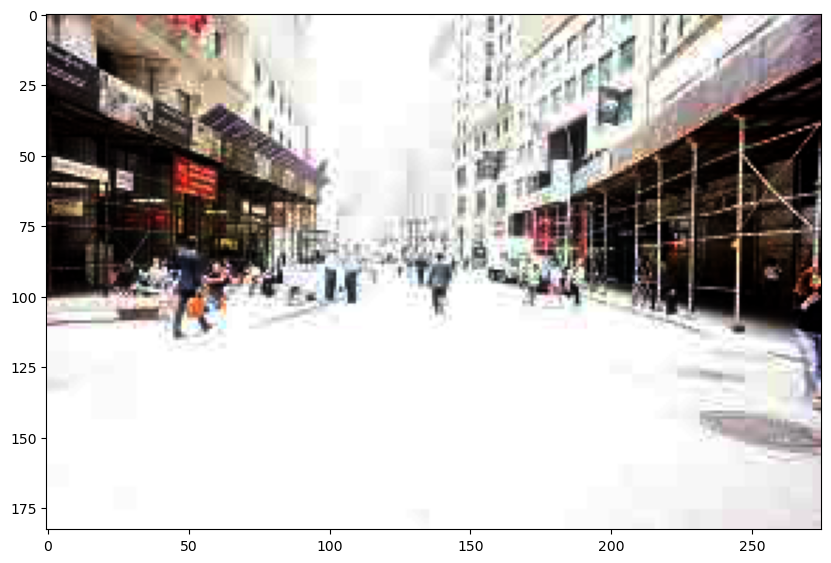

In [35]:
adjusted_high = adjust_image_gamma_lookuptable(high, 4)
plt.imshow(adjusted_high[:,:,::-1])
plt.show()

### 2.3. Correct using pixel transform

Reference: https://docs.opencv.org/3.4/d3/dc1/tutorial_basic_linear_transform.html

Dùng phép toán nhân và cộng $g(x) = \alpha f(x) + \beta$

$\alpha$ và $\beta$ còn được gọi là tham số gain và bias, hoặc tham số để điều chỉnh contrast (độ tương phản) và brightness (độ sáng)

Với ảnh số:

$g(i, j) = \alpha \cdot f(i, j) + \beta$

In [36]:
def pixel_transform(image, alpha=1.0, beta=0):
    '''
    out[pixel] = alpha * image[pixel] + beta
    '''
    output =  np.zeros(image.shape, image.dtype)
    for y in range(image.shape[0]):
        for x in range(image.shape[1]):
            for c in range(image.shape[2]):
                output[y,x,c] = np.clip(alpha*image[y, x, c] + beta, 0, 255)
                
    return output

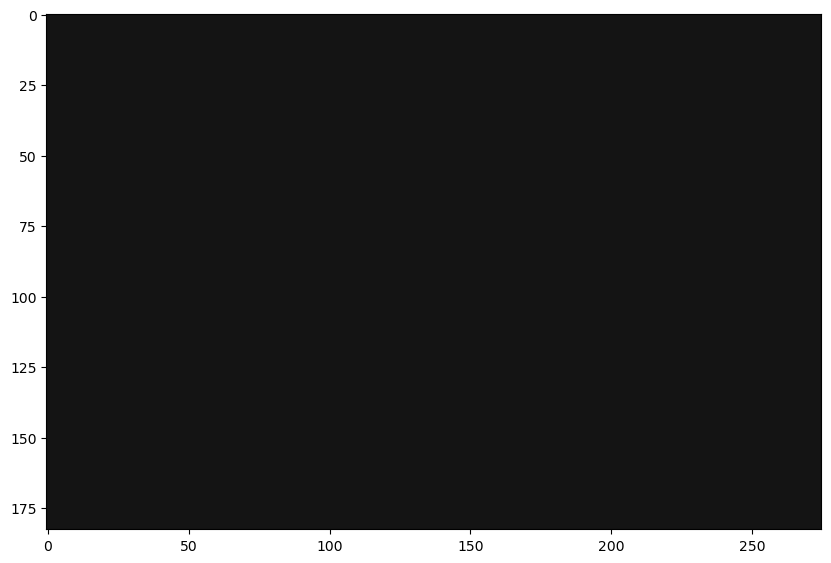

In [37]:
transformed_high = pixel_transform(high, 1e-4, 20)
plt.imshow(transformed_high[:,:,::-1])
plt.show()

In [38]:
#hhmmm can we do better?

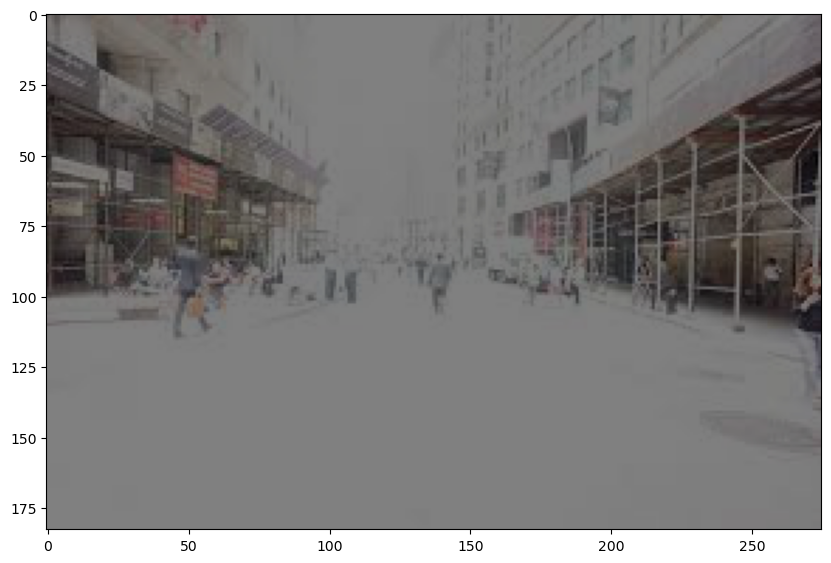

In [39]:
#anyway, a faster 
transformed_high = cv2.convertScaleAbs(high, 20, 0.5)
plt.imshow(transformed_high[:,:,::-1])
plt.show()

In [40]:
%timeit pixel_transform(high, 0.5, 20)

714 ms ± 7.26 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [41]:
%timeit cv2.convertScaleAbs(high, 20, 0.5)

53.3 μs ± 5.8 μs per loop (mean ± std. dev. of 7 runs, 10,000 loops each)


### 2.4. Point operations for combining images


### 2.4.1. Image averaging for noise reduction


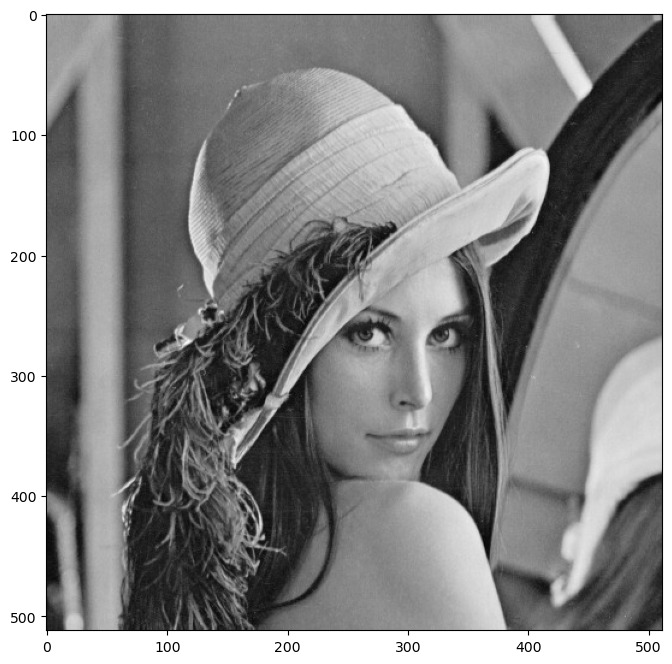

In [80]:
ori = cv2.imread("lena.jpg", 0)
plt.imshow(ori, cmap='gray')
plt.show()

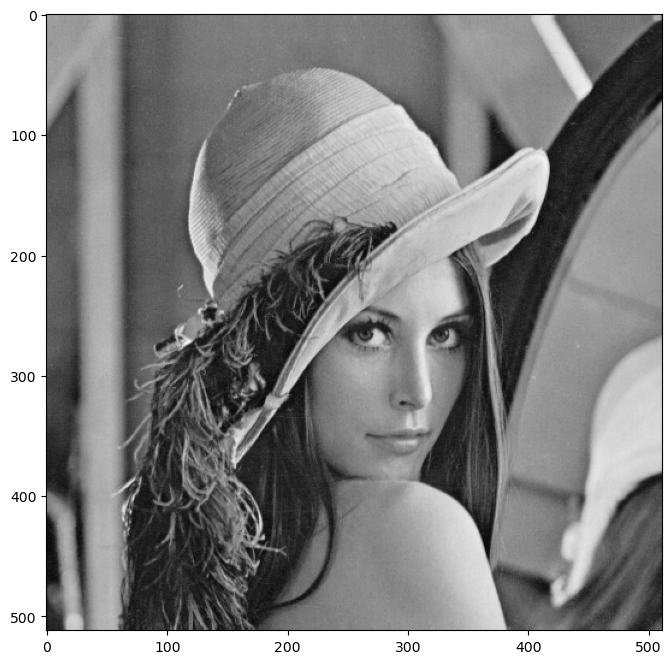

In [81]:
#now make several images from noisy
def generate_noise_image(img, mean=0, sigma=0):
    gaussian = np.random.normal(mean, sigma, img.shape)
    noisy_img = img + gaussian
    return noisy_img


def make_batch(img, num_output=4):
    sigmas = np.random.rand(4)*2
    noisy_imgs = [
                    generate_noise_image(img, sigma=sigma)
                   for sigma in sigmas
    ]
    return noisy_imgs


#make 4 images
noisy_imgs = make_batch(ori, num_output=4)
noisy_imgs = np.array(noisy_imgs)
denoised = np.mean(noisy_imgs, axis=0)
plt.imshow(denoised, cmap='gray')
plt.show()

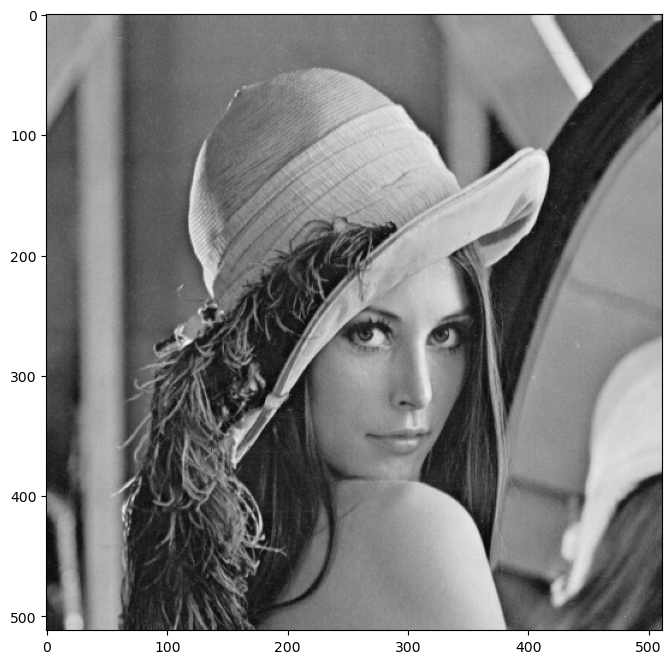

In [82]:
#make 25 images
noisy_imgs = make_batch(ori, num_output=25)
noisy_imgs = np.array(noisy_imgs)
denoised = np.mean(noisy_imgs, axis=0)
plt.imshow(denoised, cmap='gray')
plt.show()

### 2.4.2. Combination of different exposures for high-dynamic range imaging


In [83]:
hdr1 = cv2.imread("hdr1.jpeg")
hdr2 = cv2.imread("hdr2.jpeg")
hdr3 = cv2.imread("hdr3.jpeg")
hdr4 = cv2.imread("hdr4.jpeg")

stack = np.stack([hdr1, hdr2, hdr3, hdr4], axis=0)
stack.shape

(4, 2112, 2816, 3)

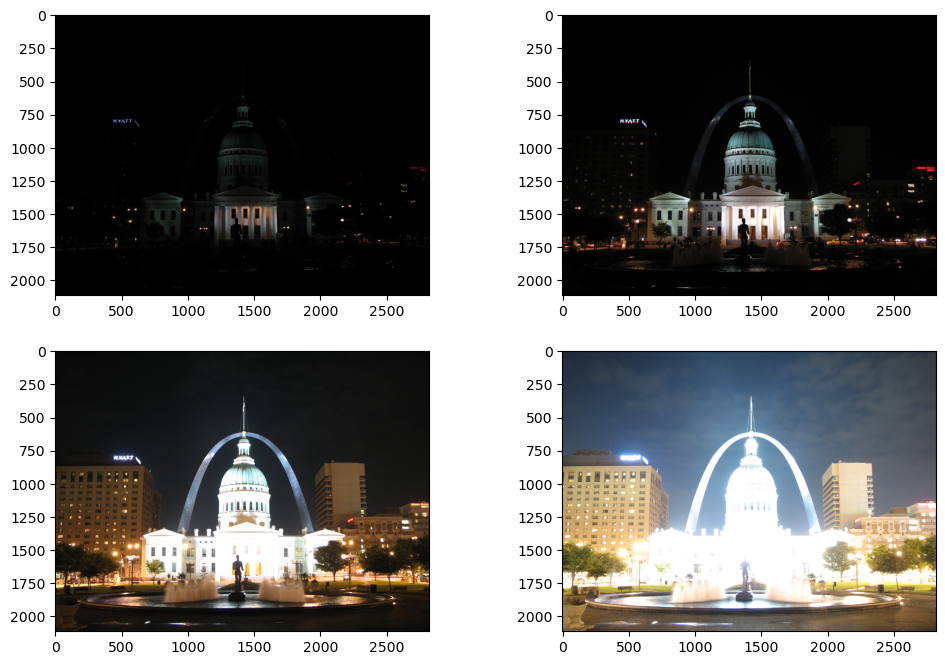

In [84]:
plt.rcParams['figure.figsize'] = [12, 8]
for i in range(4):
    plt.subplot(2, 2, i+1)
    plt.imshow(stack[i][:,:,::-1])
plt.show()

In [85]:
#Averaging to enhance contrast
hdr = np.mean(stack, axis=0)
hdr = hdr.astype(np.uint8)
hdr.shape

(2112, 2816, 3)

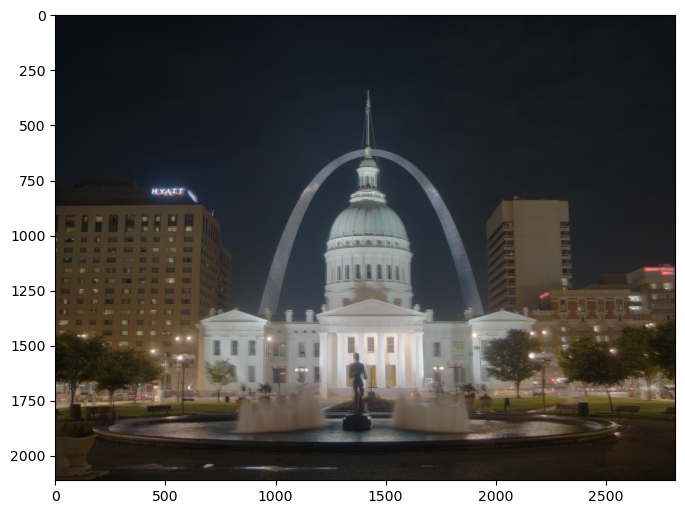

In [86]:
plt.rcParams['figure.figsize'] = [8, 8]
plt.imshow(hdr[:,:,::-1])
plt.show()

## For curious students

Reference: https://www.learnopencv.com/high-dynamic-range-hdr-imaging-using-opencv-cpp-python/


In [87]:
# Align the images using AlignMTB
# The algorithm converts all the images to median threshold bitmaps (MTB)
# An MTB for an image is calculated by assigning the value 1 to pixels brighter than median luminance and 0 otherwise/
# An MTB is invariant to the exposure time.
# Therefore, the MTBs can be aligned without requiring us to specifying the exposure time

In [88]:
alignMTB = cv2.createAlignMTB()
alignMTB.process(stack, stack)

In [89]:
# Obtain Camera Response Function (CRF)
times = np.array([ 1/30.0, 0.25, 2.5, 15.0 ], dtype=np.float32) #exposure time of each image, known from metadata
calibrateDebevec = cv2.createCalibrateDebevec()
responseDebevec = calibrateDebevec.process(stack, times)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.00033868547..364.29913].


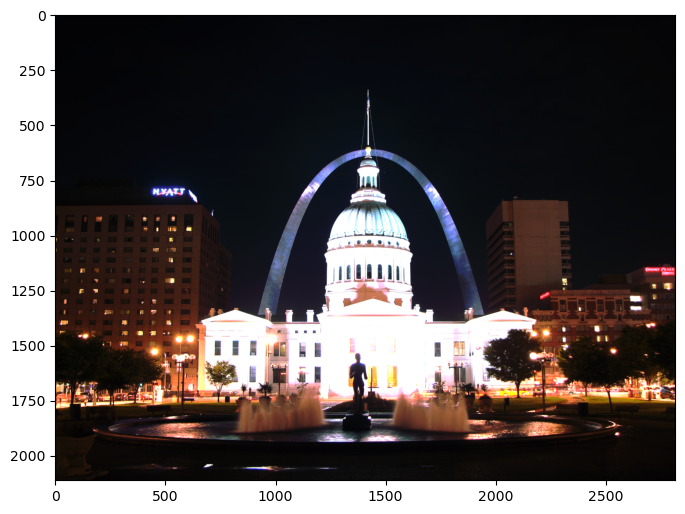

In [90]:
mergeDebevec = cv2.createMergeDebevec()
hdrDebevec = mergeDebevec.process(stack, times, responseDebevec)
plt.imshow(hdrDebevec[:,:,::-1])
plt.show()

In [91]:
# Tone mapping = Converting a HDR image to an 8-bit per channel image
# using HDR, the relative brightness information was recovered
# we need to convert the information as a 24-bit image for display

#check hdrDebevec
hdrDebevec[10:20, 10:20]

array([[[0.02302462, 0.01360008, 0.01082914],
        [0.02246168, 0.01338122, 0.01106656],
        [0.02290118, 0.01354179, 0.01057962],
        [0.02212375, 0.01331373, 0.00924294],
        [0.02265467, 0.01350722, 0.01179725],
        [0.0209519 , 0.0121612 , 0.00930669],
        [0.02285792, 0.01366408, 0.01124045],
        [0.02389569, 0.01386339, 0.01380868],
        [0.02478387, 0.01426223, 0.01340733],
        [0.02435387, 0.01417765, 0.01256097]],

       [[0.02351046, 0.01386213, 0.01103111],
        [0.02381579, 0.01406816, 0.01116773],
        [0.0231059 , 0.01368699, 0.01054582],
        [0.02397049, 0.0144042 , 0.01070151],
        [0.02561229, 0.01436507, 0.01486808],
        [0.02359103, 0.01344149, 0.01273167],
        [0.02374646, 0.01345405, 0.01241551],
        [0.02278025, 0.0130048 , 0.01221006],
        [0.02232467, 0.01297508, 0.01076363],
        [0.02342264, 0.01362228, 0.0121987 ]],

       [[0.02277188, 0.01320606, 0.01027228],
        [0.02426128, 0.0145971

In [92]:
#Common parameters of the different tone mapping algorithms
# 1. gamma. For gamma correction; gamma < 1 darkens the image; gamma >1 brightens the image
# 2. saturation: to increase or decrease the amount of saturation. Higher -> colors are richer and more intense
#     Closer to zero, colors fade away to grayscale
# 3. contrast: controls the contrast. = log(maxPixelvalue/minPixelvalue)

#Opencv implements 4 tone mappings


[ WARN:0@1035.683] global matrix_expressions.cpp:1334 assign OpenCV/MatExpr: processing of multi-channel arrays might be changed in the future: https://github.com/opencv/opencv/issues/16739
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.366008e-16..3.0].


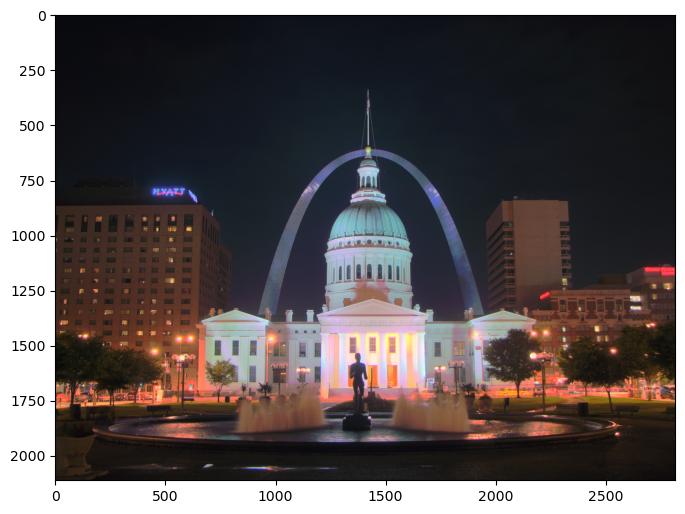

In [93]:
# Tonemap using Drago's method to obtain 24-bit color image
tonemapDrago = cv2.createTonemapDrago(1.0, 0.7)
ldrDrago = tonemapDrago.process(hdrDebevec)
ldrDrago = 3 * ldrDrago
plt.imshow(ldrDrago[:,:,::-1])
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [9.7704756e-26..1.916052e+26].


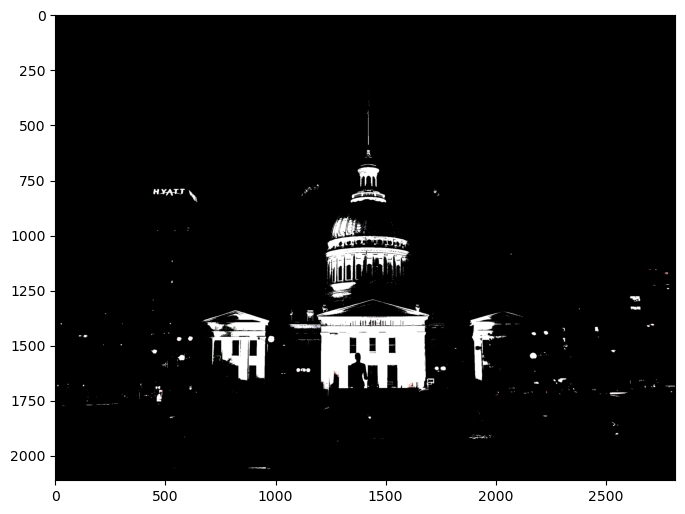

In [98]:
# Tonemap using Durand's method obtain 24-bit color image
# removed from opencv
# tonemapDurand = cv2.createTonemapDurand(1.5,4,1.0,1,1)
# ldrDurand = tonemapDurand.process(hdrDebevec)
# ldrDurand = 3 * ldrDurand
# plt.imshow(ldrDurand[:,:,::-1])
# plt.show()